In [1]:
from collections import namedtuple
from pathlib import Path
from pprint import pprint

import cv2
import numpy as np
import pandas as pd
from PIL import Image

import matplotlib as mpl
mpl_params = {
    'figure.figsize': (10, 5),
    'figure.dpi': 300,
}
from matplotlib import pyplot as plt

mpl.rcParams.update(mpl_params)

import seaborn as sns
sns.set()

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

import altair as alt

import torch
import torchvision

In [2]:
TRAIN_DIR = Path('../input/train')

In [3]:
LABELS = {
    0: 'Nucleoplasm', 
    1: 'Nuclear membrane',   
    2: 'Nucleoli',   
    3: 'Nucleoli fibrillar center' ,  
    4: 'Nuclear speckles',
    5: 'Nuclear bodies',
    6: 'Endoplasmic reticulum',   
    7: 'Golgi apparatus',
    8: 'Peroxisomes',
    9: 'Endosomes',
    10: 'Lysosomes',
    11: 'Intermediate filaments',   
    12: 'Actin filaments',
    13: 'Focal adhesion sites',   
    14: 'Microtubules',
    15: 'Microtubule ends',   
    16: 'Cytokinetic bridge',   
    17: 'Mitotic spindle',
    18: 'Microtubule organizing center',  
    19: 'Centrosome',
    20: 'Lipid droplets',   
    21: 'Plasma membrane',   
    22: 'Cell junctions', 
    23: 'Mitochondria',
    24: 'Aggresome',
    25: 'Cytosol',
    26: 'Cytoplasmic bodies',   
    27: 'Rods & rings'
}

LABEL_NAMES = list(LABELS.values())

In [4]:
df = pd.read_csv('../input/train.csv')
df.head()

,Id,Target
0,00070df0-bbc3-11e8-b2bc-ac1f6b6435d0,16 0
1,000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0,7 1 2 0
2,000a9596-bbc4-11e8-b2bc-ac1f6b6435d0,5
3,000c99ba-bba4-11e8-b2b9-ac1f6b6435d0,1
4,001838f8-bbca-11e8-b2bc-ac1f6b6435d0,18


In [5]:
print(f'''
    {df.Id.count():,} samples with four images each
    {len(df.Target.unique())} unique multi-label combinations
''')


    31,072 samples with four images each
    582 unique multi-label combinations



## How many labels are we talking per sample?

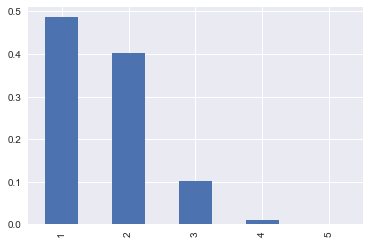

In [6]:
df['num_labels'] = df.Target.apply(lambda x: len(x.split()))
(df['num_labels'].value_counts() / len(df['num_labels'])).plot(kind='bar');

## How frequent are each of the labels?

In [7]:
# Based off fill_targets https://www.kaggle.com/allunia/protein-atlas-exporation-and-baseline
for name in LABELS.values():
    df[name] = 0
    
def one_hot(row):
    labels = row.Target.split()
    for num in labels:
        name = LABELS[int(num)]
        row[name]= 1
    return row

df = df.apply(one_hot, axis=1)
df.head()

,Id,Target,num_labels,Nucleoplasm,Nuclear membrane,Nucleoli,Nucleoli fibrillar center,Nuclear speckles,Nuclear bodies,Endoplasmic reticulum,...,Microtubule organizing center,Centrosome,Lipid droplets,Plasma membrane,Cell junctions,Mitochondria,Aggresome,Cytosol,Cytoplasmic bodies,Rods & rings
0,00070df0-bbc3-11e8-b2bc-ac1f6b6435d0,16 0,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,000a6c98-bb9b-11e8-b2b9-ac1f6b6435d0,7 1 2 0,4,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,000a9596-bbc4-11e8-b2bc-ac1f6b6435d0,5,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,000c99ba-bba4-11e8-b2b9-ac1f6b6435d0,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,001838f8-bbca-11e8-b2bc-ac1f6b6435d0,18,1,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


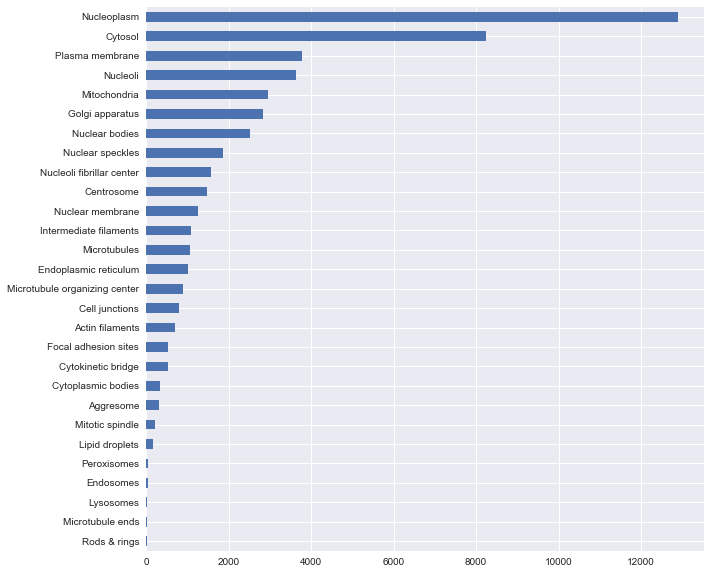

In [8]:
df[LABEL_NAMES].sum().sort_values().plot(kind='barh', figsize=(10, 10));

## What is the correlation between all the labels?

In [9]:
# Again from https://www.kaggle.com/allunia/protein-atlas-exporation-and-baseline
fig, ax = plt.subplots(figsize=(30, 15), dpi=500)
sns.heatmap(
    data=df[LABEL_NAMES][df.num_labels > 1].corr(),
    vmin=-1,
    vmax=1,
    ax=ax,
    annot=True,
    fmt='0.2f',
#     square=True
);

## Let's look at samples for each label where only one label is given

In [10]:
def get_representative_samples_ids(df, label_name, num_samples):
    return df.Id[(df.num_labels == 1) & (df[label_name] == 1)][:num_samples].values

In [11]:
single_labels = {}
for label in LABEL_NAMES:
    single_labels[label] = get_representative_samples_ids(df, label, 5)

In [171]:
def diplay_sample_images(sample):
    return Image.fromarray(np.hstack(sample))

In [201]:
SampleImages = namedtuple('SampleImages', 'protein_g nucleus_b micro_r endo_y')
def get_sample_images(sample_id):
    r = np.array(Image.open(TRAIN_DIR / f'{sample_id}_red.png'), np.uint8)
    g = np.array(Image.open(TRAIN_DIR / f'{sample_id}_green.png'), np.uint8)
    b = np.array(Image.open(TRAIN_DIR / f'{sample_id}_blue.png'), np.uint8)
    y = np.array(Image.open(TRAIN_DIR / f'{sample_id}_yellow.png'), np.uint8)
    return SampleImages(
        protein_g=g,
        nucleus_b=b,
        micro_r=r,
        endo_y=y
    )

In [202]:
test_id = 'ac39847a-bbb1-11e8-b2ba-ac1f6b6435d0'
sample = get_sample_images(test_id)

In [1]:
empty = np.zeros((512, 512), np.uint8)

Image.fromarray(
   
    np.hstack([
        
        np.stack([
            sample.micro_r,
            empty,
            empty
        ], axis=2),

        np.stack([
            empty,
            sample.protein_g,
            empty
        ], axis=2),

        np.stack([
            empty,
            empty,
            sample.nucleus_b
        ], axis=2),

        np.stack([
            sample.endo_y,
            sample.endo_y,
            empty,
        ], axis=2),

        np.stack([
            sample.micro_r // 2 + sample.endo_y // 2,
            sample.protein_g // 2 + sample.endo_y // 2,
            sample.nucleus_b // 2
        ], axis=2)
    ])
)

NameError: name 'np' is not defined

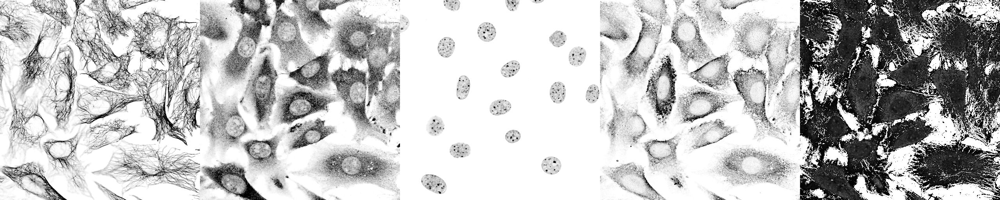

In [212]:
empty = np.zeros((512, 512), np.uint8)

Image.fromarray(
   
    np.hstack([
        
        np.stack([
            255 - sample.micro_r,
            255 - sample.micro_r,
            255 - sample.micro_r
        ], axis=2),

        np.stack([
            255 - sample.protein_g,
            255 - sample.protein_g,
            255 - sample.protein_g
        ], axis=2),

        np.stack([
            255 - sample.nucleus_b,
            255 - sample.nucleus_b,
            255 - sample.nucleus_b
        ], axis=2),

        np.stack([
            255 - sample.endo_y,
            255 - sample.endo_y,
            255 - sample.endo_y,
        ], axis=2),

        np.stack([
            255 - sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
            255 - sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
            255 - sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
        ], axis=2)
    ])
)

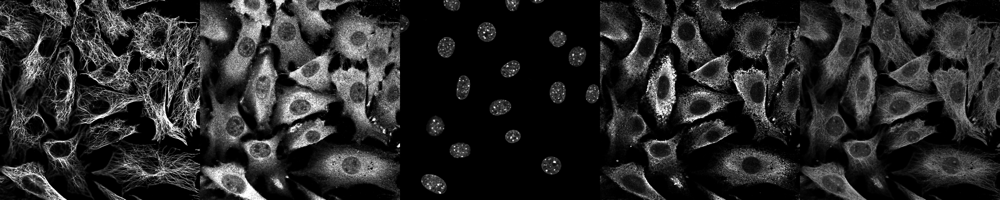

In [210]:
empty = np.zeros((512, 512), np.uint8)

Image.fromarray(
   
    np.hstack([
        
        np.stack([
            sample.micro_r,
            sample.micro_r,
            sample.micro_r
        ], axis=2),

        np.stack([
            sample.protein_g,
            sample.protein_g,
            sample.protein_g
        ], axis=2),

        np.stack([
            sample.nucleus_b,
            sample.nucleus_b,
            sample.nucleus_b
        ], axis=2),

        np.stack([
            sample.endo_y,
            sample.endo_y,
            sample.endo_y,
        ], axis=2),

        np.stack([
            sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
            sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
            sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
        ], axis=2)
    ])
)

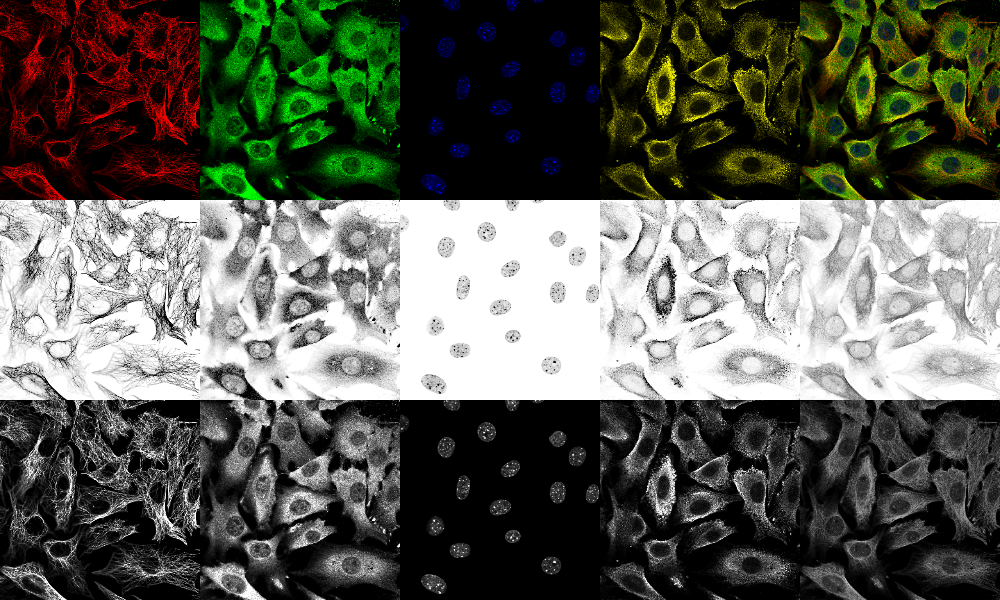

In [214]:
empty = np.zeros((512, 512), np.uint8)

Image.fromarray(
    
    np.vstack([
   
        np.hstack([

            np.stack([
                sample.micro_r,
                empty,
                empty
            ], axis=2),

            np.stack([
                empty,
                sample.protein_g,
                empty
            ], axis=2),

            np.stack([
                empty,
                empty,
                sample.nucleus_b
            ], axis=2),

            np.stack([
                sample.endo_y,
                sample.endo_y,
                empty,
            ], axis=2),

            np.stack([
                sample.micro_r // 2 + sample.endo_y // 2,
                sample.protein_g // 2 + sample.endo_y // 2,
                sample.nucleus_b // 2
            ], axis=2)
        ]),

            np.hstack([

                np.stack([
                    255 - sample.micro_r,
                    255 - sample.micro_r,
                    255 - sample.micro_r
                ], axis=2),

                np.stack([
                    255 - sample.protein_g,
                    255 - sample.protein_g,
                    255 - sample.protein_g
                ], axis=2),

                np.stack([
                    255 - sample.nucleus_b,
                    255 - sample.nucleus_b,
                    255 - sample.nucleus_b
                ], axis=2),

                np.stack([
                    255 - sample.endo_y,
                    255 - sample.endo_y,
                    255 - sample.endo_y,
                ], axis=2),

                np.stack([
                    255 - (sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4),
                    255 - (sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4),
                    255 - (sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4),
                ], axis=2)
            ]),
   
        np.hstack([

            np.stack([
                sample.micro_r,
                sample.micro_r,
                sample.micro_r
            ], axis=2),

            np.stack([
                sample.protein_g,
                sample.protein_g,
                sample.protein_g
            ], axis=2),

            np.stack([
                sample.nucleus_b,
                sample.nucleus_b,
                sample.nucleus_b
            ], axis=2),

            np.stack([
                sample.endo_y,
                sample.endo_y,
                sample.endo_y,
            ], axis=2),

            np.stack([
                sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
                sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
                sample.micro_r // 4 + sample.protein_g // 4 + sample.nucleus_b // 4 + sample.endo_y // 4,
            ], axis=2)
        ])
    ])
)


In [200]:
np.array([255, 255, 255], dtype=np.uint8) + np.array([100, 2, 2], np.uint8)

array([99,  1,  1], dtype=uint8)

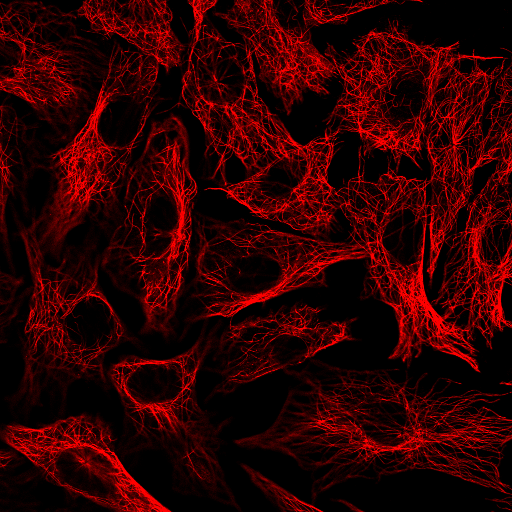

In [143]:
Image.fromarray(np.stack([
    sample.micro_r,
    np.zeros((512, 512), dtype=np.uint8),
    np.zeros((512, 512), dtype=np.uint8)
], axis=2))

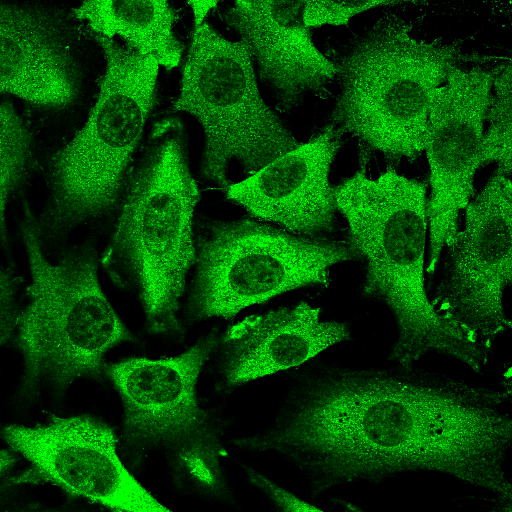

In [148]:
Image.fromarray(np.stack([
    np.zeros((512, 512), dtype=np.uint8),
    sample.protein_g,
    np.zeros((512, 512), dtype=np.uint8)
], axis=2))

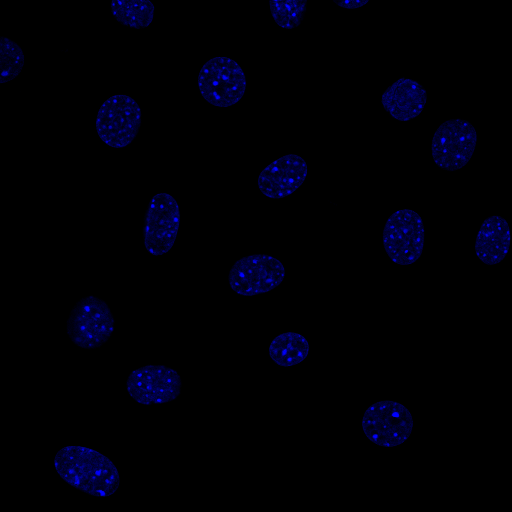

In [149]:
Image.fromarray(np.stack([
    np.zeros((512, 512), dtype=np.uint8),
    np.zeros((512, 512), dtype=np.uint8),
    sample.nucleus_b
], axis=2))

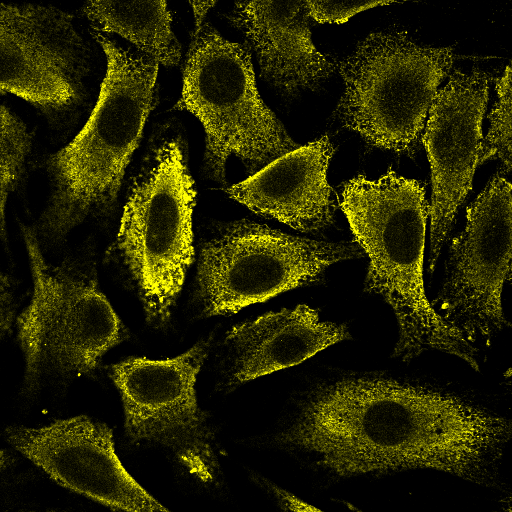

In [152]:
Image.fromarray(np.stack([
    sample.endo_y,
    sample.endo_y,
    np.zeros((512, 512), dtype=np.uint8),
], axis=2))

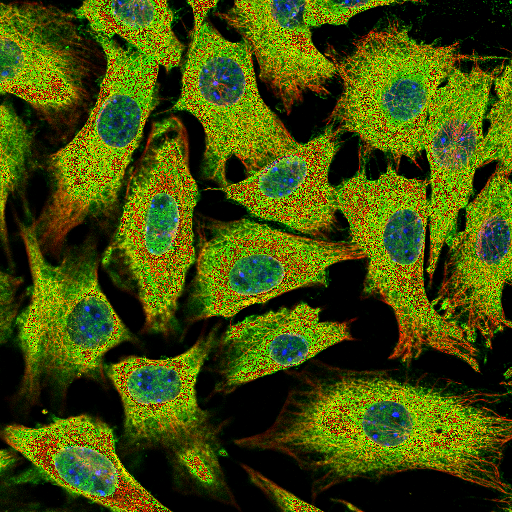

In [155]:
Image.fromarray(np.stack([
    sample.micro_r + sample.endo_y,
    sample.protein_g + sample.endo_y,
    sample.nucleus_b
], axis=2))

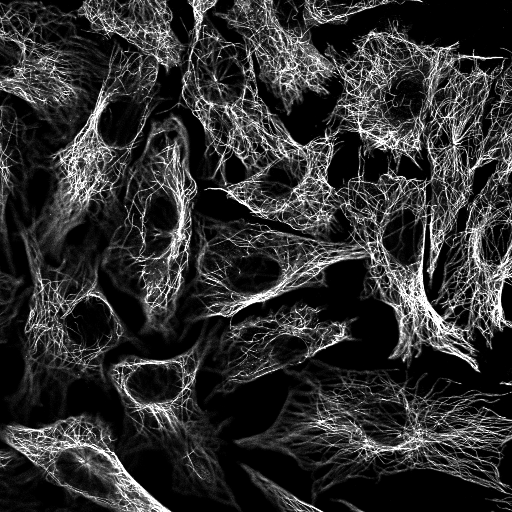

In [136]:
Image.open(TRAIN_DIR / f'{test_id}_red.png')

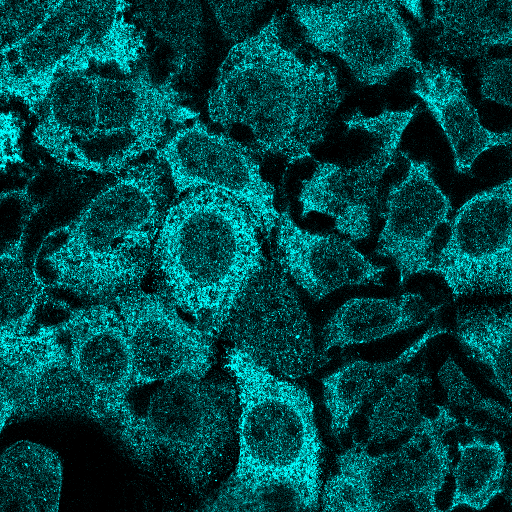

In [101]:
Image.fromarray(np.stack([np.zeros((512, 512), dtype=np.uint8), sample.endoplasmic_reticulum, sample.endoplasmic_reticulum]).transpose(2, 1, 0))

In [82]:
cdict4 = {'red': ((0.0,  0.0, 0.0),
                   (0.75, 1.0, 1.0),
                   (1.0,  1.0, 1.0)),

         'green': ((0.0,  0.0, 0.0),
                   (0.75, 1.0, 1.0),
                   (1.0,  1.0, 1.0)),

         'blue':  ((0.0,  0.0, 0.0),
                   (1.0,  0.0, 0.0))}

plt.register_cmap(name='yellows', data=cdict4)

In [88]:
np.array(sample.endoplasmic_reticulum).shape

(512, 512)

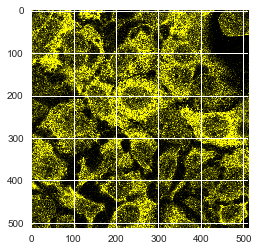

In [84]:
plt.imshow(np.array(sample.endoplasmic_reticulum), cmap='yellows')

In [38]:
ordered = df[LABEL_NAMES].sum().sort_values(ascending=False)

In [51]:
for label, count in ordered.items():
    sample_ids = single_labels[label]
    if len(sample_ids) == 0:
        print('Skipping ', label, count)
        continue
    sample_hstacks = []
    for id_ in sample_ids:
        sample = get_sample_images(id_)
        sample_hstacks.append(np.hstack(sample))
#         sample_hstacks.append([np.array(x) for x in sample])
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(np.vstack(sample_hstacks), cmap='gray')
    ax.set_title(f'{label} {count:,}', fontsize=20)
    plt.show() 

ValueError: invalid number of arguments

In [ ]:
for name in LABEL_NAMES:
    num_samples = len(df[(df.num_labels == 1) & (df[name] == 1)])
    print(f'{name:30} {num_samples}' )

In [ ]:
test = [path for path in Path('../input/train').iterdir() if test_id in path.name]
test

In [ ]:
Image.fromarray(np.hstack([np.array(Image.open(x)) for x in test]))

In [ ]:
for each image in sample set of all representative labels with only one label in image
[r, g, b, y, combined]

In [ ]:
stack = np.stack([np.array(Image.open(x)) for x in test])

In [ ]:
Image.alpha_composite?